In [3]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

In [4]:
data_boston_house = pd.read_csv("dataset/boston_housing.csv")
data_boston_house

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [5]:
data_boston_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   crim     506 non-null    float64
 1   zn       506 non-null    float64
 2   indus    506 non-null    float64
 3   chas     506 non-null    int64  
 4   nox      506 non-null    float64
 5   rm       506 non-null    float64
 6   age      506 non-null    float64
 7   dis      506 non-null    float64
 8   rad      506 non-null    int64  
 9   tax      506 non-null    int64  
 10  ptratio  506 non-null    float64
 11  b        506 non-null    float64
 12  lstat    506 non-null    float64
 13  medv     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


crim
per capita crime rate by town.

zn
proportion of residential land zoned for lots over 25,000 sq.ft.

indus
proportion of non-retail business acres per town.

chas
Charles River dummy variable (= 1 if tract bounds river; 0 otherwise).

nox
nitrogen oxides concentration (parts per 10 million).

rm
average number of rooms per dwelling.

age
proportion of owner-occupied units built prior to 1940.

dis
weighted mean of distances to five Boston employment centres.

rad
index of accessibility to radial highways.

tax
full-value property-tax rate per \$10,000.

ptratio
pupil-teacher ratio by town.

black
1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town.

lstat
lower status of the population (percent).

medv
median value of owner-occupied homes in \$1000s.

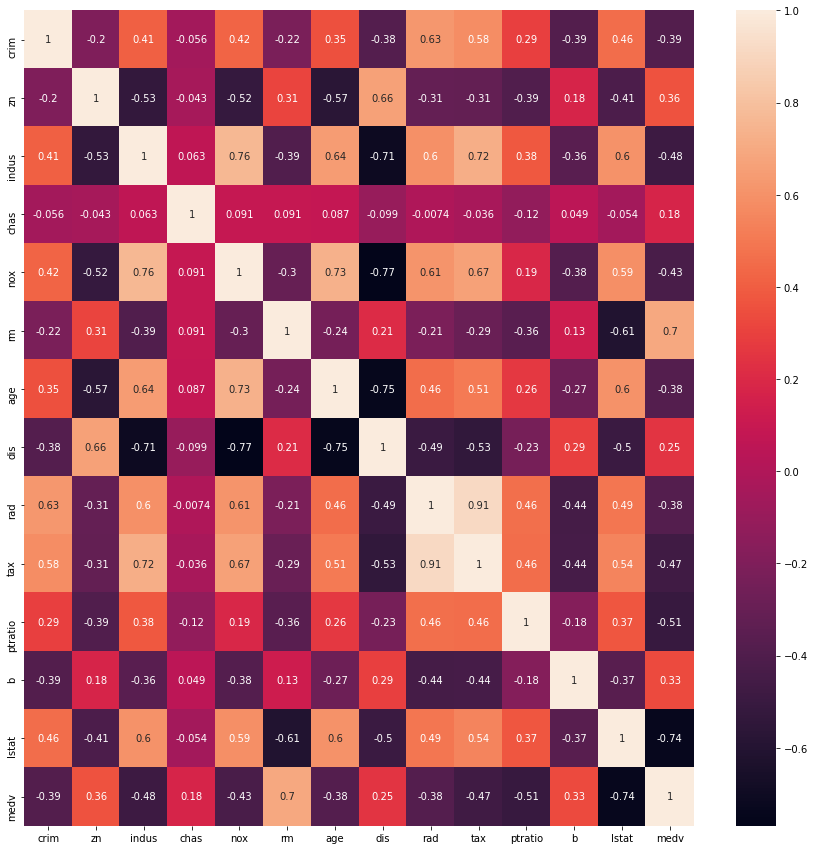

In [6]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(data=data_boston_house.corr(),annot=True)
plt.show()

In [7]:
for data_i in data_boston_house.corr():
    for data_j in data_boston_house.corr():
        if data_boston_house.corr()[data_i][data_j]>=0.5 and data_boston_house.corr()[data_i][data_j]<1:
            print(data_i,data_j,data_boston_house.corr()[data_i][data_j])

crim rad 0.6255051452626024
crim tax 0.5827643120325854
zn dis 0.6644082227621105
indus nox 0.7636514469209139
indus age 0.6447785113552554
indus rad 0.5951292746038485
indus tax 0.7207601799515422
indus lstat 0.603799716476621
nox indus 0.7636514469209139
nox age 0.7314701037859592
nox rad 0.6114405634855762
nox tax 0.6680232004030217
nox lstat 0.5908789208808451
rm medv 0.6953599470715401
age indus 0.6447785113552554
age nox 0.7314701037859592
age tax 0.5064555935507051
age lstat 0.6023385287262395
dis zn 0.6644082227621105
rad crim 0.6255051452626024
rad indus 0.5951292746038485
rad nox 0.6114405634855762
rad tax 0.9102281885331865
tax crim 0.5827643120325854
tax indus 0.7207601799515422
tax nox 0.6680232004030217
tax age 0.5064555935507051
tax rad 0.9102281885331865
tax lstat 0.5439934120015698
lstat indus 0.603799716476621
lstat nox 0.5908789208808451
lstat age 0.6023385287262395
lstat tax 0.5439934120015698
medv rm 0.6953599470715401


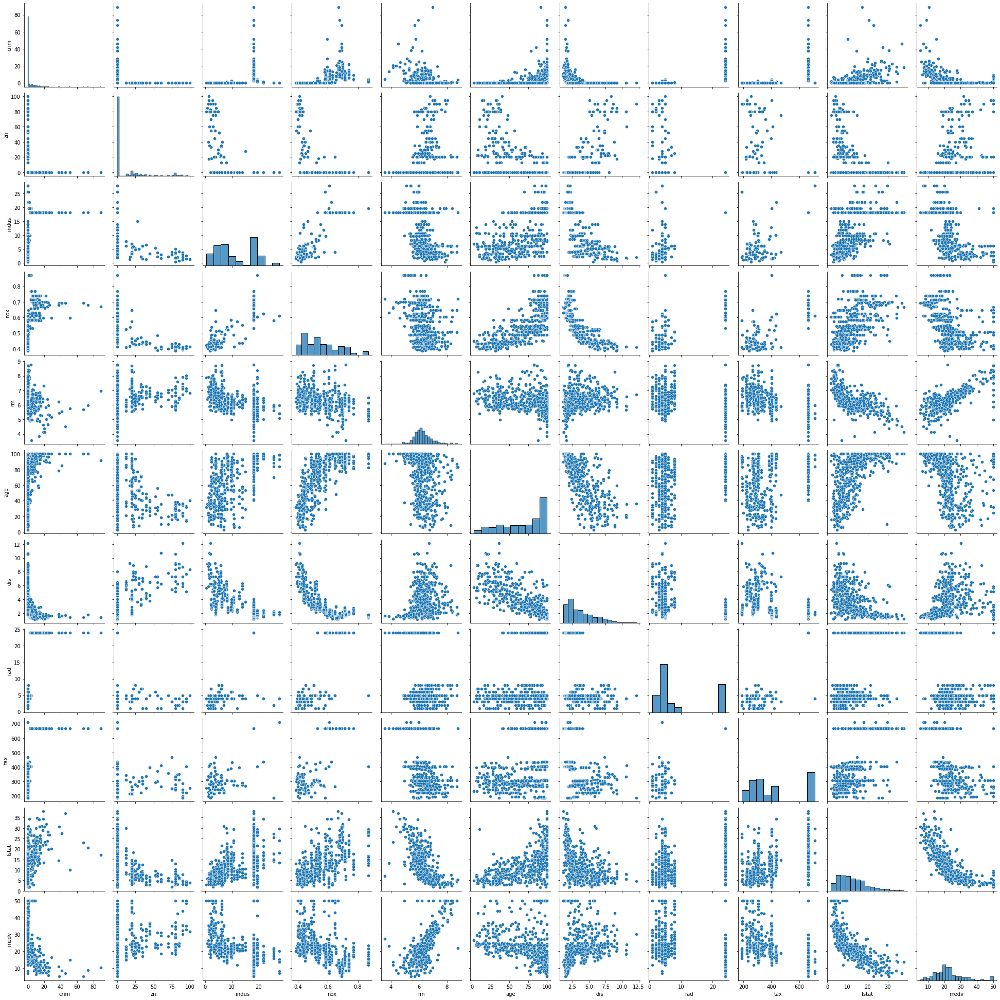

In [8]:
sns.pairplot(data=data_boston_house[['crim','zn','indus','nox','rm','age','dis','rad','tax','lstat','medv']])

<AxesSubplot:xlabel='lstat', ylabel='medv'>

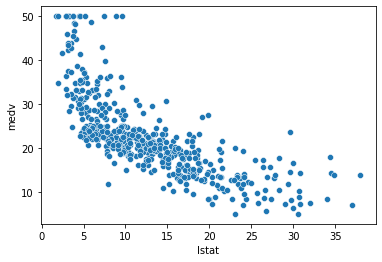

In [62]:
sns.scatterplot(data=data_boston_house[['lstat','medv']],x='lstat',y='medv')

C:\Users\ferdi\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='lstat'>

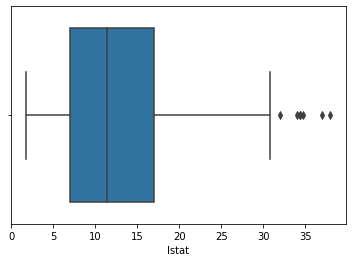

In [63]:
sns.boxplot(data_boston_house['lstat'])

C:\Users\ferdi\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='medv'>

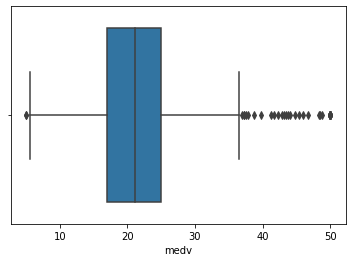

In [64]:
sns.boxplot(data_boston_house['medv'])

C:\Users\ferdi\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='medv'>

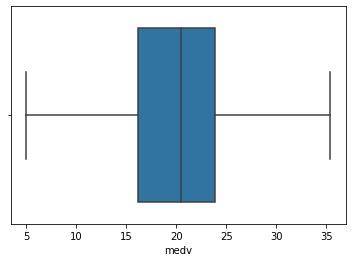

In [65]:
data_filter = data_boston_house[data_boston_house['medv']<36]
sns.boxplot(data_filter['medv'])

C:\Users\ferdi\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='lstat'>

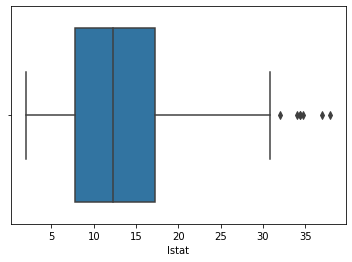

In [66]:
sns.boxplot(data_filter['lstat'])

C:\Users\ferdi\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='lstat'>

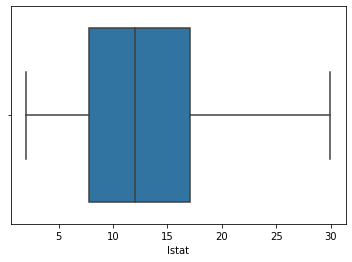

In [67]:
data_filter = data_filter[data_filter['lstat']<30]
sns.boxplot(data_filter['lstat'])

In [68]:
data_filter

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv,mx_rm,mx_lstat,mx_medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0,0.577505,0.089680,0.422222
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6,0.547998,0.204470,0.368889
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7,0.694386,0.063466,0.660000
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4,0.658555,0.033389,0.631111
5,0.02985,0.0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21,28.7,0.549722,0.096026,0.526667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4,0.580954,0.219095,0.386667
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6,0.490324,0.202815,0.346667
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9,0.654340,0.107892,0.420000
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0,0.619467,0.131071,0.377778


<AxesSubplot:xlabel='lstat', ylabel='medv'>

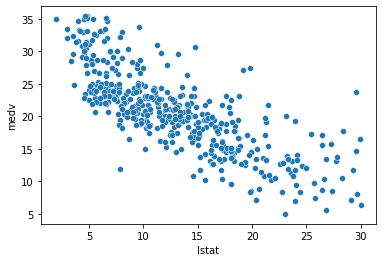

In [69]:
sns.scatterplot(data=data_filter[['lstat','medv']],x='lstat',y='medv')

In [70]:
train_data, test_data = train_test_split(data_filter[['lstat','medv']], test_size=0.2)
train_label = train_data['medv']
train_feature = train_data.drop(['medv'], axis=1)
test_label = test_data['medv']
test_feature = test_data.drop(['medv'], axis=1)
lr_model = LinearRegression()
lr_model.fit(X=train_feature, y=train_label)

LinearRegression()

In [71]:
accuracy_score = lr_model.score(test_feature,test_label)
accuracy_score

0.633633285944674

In [72]:
mdev_pred = lr_model.predict(test_feature)

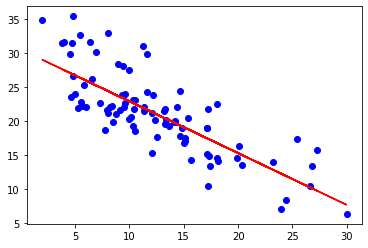

In [73]:
plt.scatter(test_data['lstat'], test_data['medv'], color='blue')
plt.plot(test_data['lstat'], mdev_pred, color='red')

<AxesSubplot:xlabel='medv', ylabel='rm'>

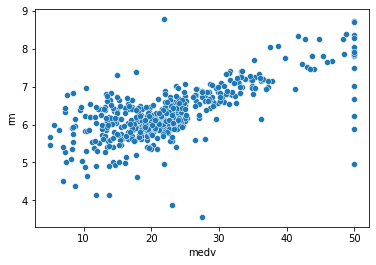

In [74]:
sns.scatterplot(data=data_boston_house[['medv','rm']],x='medv',y='rm')

In [75]:
train_data, test_data = train_test_split(data_boston_house[['medv','rm']], test_size=0.2)
train_label = train_data['medv']
train_feature = train_data.drop(['medv'], axis=1)
test_label = test_data['medv']
test_feature = test_data.drop(['medv'], axis=1)
lr_model = LinearRegression()
lr_model.fit(X=train_feature, y=train_label)

LinearRegression()

In [76]:
accuracy_score = lr_model.score(test_feature,test_label)
accuracy_score

0.5084422038270614

In [77]:
mdev_pred = lr_model.predict(test_feature)

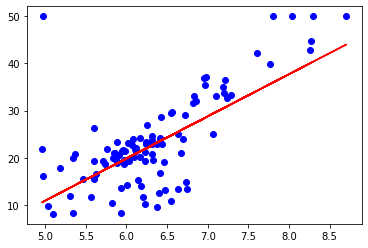

In [78]:
plt.scatter(test_data['rm'], test_data['medv'], color='blue')
plt.plot(test_data['rm'], mdev_pred, color='red')

<AxesSubplot:xlabel='lstat', ylabel='rm'>

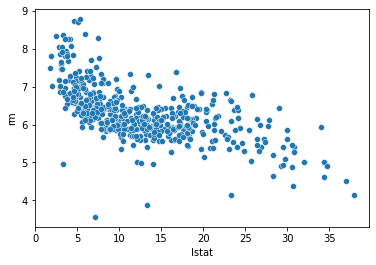

In [79]:
sns.scatterplot(data=data_boston_house[['lstat','rm']],x='lstat',y='rm')

In [80]:
train_data, test_data = train_test_split(data_boston_house[['lstat','rm']], test_size=0.2)
train_label = train_data['lstat']
train_feature = train_data.drop(['lstat'], axis=1)
test_label = test_data['lstat']
test_feature = test_data.drop(['lstat'], axis=1)
lr_model = LinearRegression()
lr_model.fit(X=train_feature, y=train_label)

LinearRegression()

In [81]:
accuracy_score = lr_model.score(test_feature,test_label)
accuracy_score

0.46487304153392384

In [82]:
lstat_pred = lr_model.predict(test_feature)

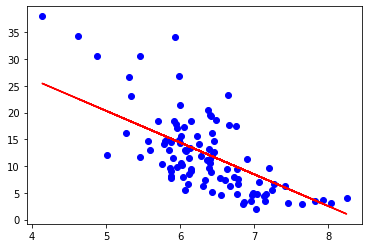

In [83]:
plt.scatter(test_data['rm'], test_data['lstat'], color='blue')
plt.plot(test_data['rm'], lstat_pred, color='red')

In [84]:
from sklearn.preprocessing import MinMaxScaler

In [85]:
mx = MinMaxScaler()

In [86]:
data_boston_house['mx_rm']=mx.fit_transform(data_boston_house[['rm']])
data_boston_house['mx_lstat']=mx.fit_transform(data_boston_house[['lstat']])

data_boston_house[['mx_rm','mx_lstat']]

,mx_rm,mx_lstat
0,0.577505,0.089680
1,0.547998,0.204470
2,0.694386,0.063466
3,0.658555,0.033389
4,0.687105,0.099338
...,...,...
501,0.580954,0.219095
502,0.490324,0.202815
503,0.654340,0.107892
504,0.619467,0.131071


In [87]:
train_data, test_data = train_test_split(data_boston_house[['mx_lstat','mx_rm']], test_size=0.2)
train_label = train_data['mx_lstat']
train_feature = train_data.drop(['mx_lstat'], axis=1)
test_label = test_data['mx_lstat']
test_feature = test_data.drop(['mx_lstat'], axis=1)
lr_model = LinearRegression()
lr_model.fit(X=train_feature, y=train_label)

LinearRegression()

In [88]:
accuracy_score = lr_model.score(test_feature,test_label)
accuracy_score

0.3913848703969979

In [89]:
lstat_pred = lr_model.predict(test_feature)

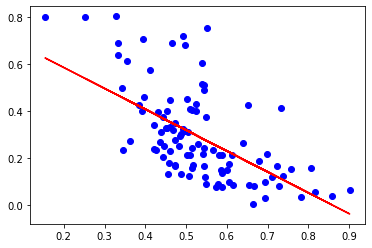

In [90]:
plt.scatter(test_data['mx_rm'], test_data['mx_lstat'], color='blue')
plt.plot(test_data['mx_rm'], lstat_pred, color='red')

In [91]:
data_boston_house['mx_medv']=mx.fit_transform(data_boston_house[['medv']])
data_boston_house['mx_lstat']=mx.fit_transform(data_boston_house[['lstat']])

data_boston_house[['mx_medv','mx_lstat']]

,mx_medv,mx_lstat
0,0.422222,0.089680
1,0.368889,0.204470
2,0.660000,0.063466
3,0.631111,0.033389
4,0.693333,0.099338
...,...,...
501,0.386667,0.219095
502,0.346667,0.202815
503,0.420000,0.107892
504,0.377778,0.131071


In [92]:
train_data, test_data = train_test_split(data_boston_house[['mx_lstat','mx_medv']], test_size=0.2)
train_label = train_data['mx_medv']
train_feature = train_data.drop(['mx_medv'], axis=1)
test_label = test_data['mx_medv']
test_feature = test_data.drop(['mx_medv'], axis=1)
lr_model = LinearRegression()
lr_model.fit(X=train_feature, y=train_label)

LinearRegression()

In [93]:
accuracy_score = lr_model.score(test_feature,test_label)
accuracy_score

0.453412312515326

C:\Users\ferdi\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='rm', ylabel='lstat'>

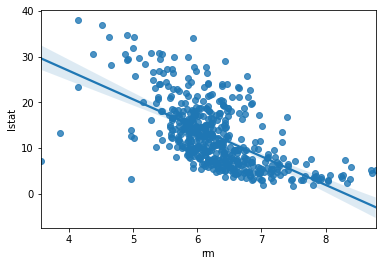

In [94]:
sns.regplot(data_boston_house['rm'],data_boston_house['lstat'])